# TOUTORIAL DEPLOY YOLO 
My tutorial is based on https://github.com/AlexeyAB/darknet 



In the first section, I deploy a **yolov1,yolov2,yolov3,yolov4**. 
First of all, I change run-type the notebook to run with GPU. On the top left corner, the notebook chooses Runtime after that click "change runtime type" and you can see hardware accelerator tag and choose GPU.


# Clone repository from GitHub && Config
Step by step config it:
- Clone repository:

      !git clone https://github.com/AlexeyAB/darknet

- Change the current file to darknet folder use command line:

      cd darknet
- Check GPU is activate the notebook with command:
    
      !nvidia-smi
- Set CUDANN = 1, OPENCV = 1, CPU = 1 with command:

      !sed -i 's/OPENCV=0/OPENCV=1/' Makefile
      !sed -i 's/GPU=0/GPU=1/' Makefile
      !sed -i 's/CUDNN=0/CUDNN=1/' Makefile
- Finally, We running project with make file command:

      !make
- - If make fail, You run make clean and repeat until making complete with the command line:

      ! make clean

- At the point, we have completed the project initialization. Then We can see step by step to run Yolo in the bellow notebook. Make sure, You complete all the steps.

- Note: In the ways, You must clone the project only one time. The next running project, you running all command except clone darknet command.


In [ ]:
# !git clone https://github.com/AlexeyAB/darknet

fatal: destination path 'darknet' already exists and is not an empty directory.


In [ ]:
cd /darknet

In [ ]:
!nvidia-smi

Sun Jun  7 10:01:13 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [ ]:
# change makefile to have GPU and OPENCV enabled
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

In [ ]:
!make

chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:910:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void cv_draw_object(image, float*, int, int, int*, float*, int*, int, char**)’:
./src/image_opencv.cpp:1391:14: warning: unused variable ‘buff’ [-Wunused-variable]
         char buff[100];
              ^~~~
./src/image_opencv.cpp:1367:9: warning: unused variable ‘it_tb_res’ [-Wunused-variable]
     int it_tb_

In [ ]:
!make clean

rm -rf ./obj/image_opencv.o ./obj/http_stream.o ./obj/gemm.o ./obj/utils.o ./obj/dark_cuda.o ./obj/convolutional_layer.o ./obj/list.o ./obj/image.o ./obj/activations.o ./obj/im2col.o ./obj/col2im.o ./obj/blas.o ./obj/crop_layer.o ./obj/dropout_layer.o ./obj/maxpool_layer.o ./obj/softmax_layer.o ./obj/data.o ./obj/matrix.o ./obj/network.o ./obj/connected_layer.o ./obj/cost_layer.o ./obj/parser.o ./obj/option_list.o ./obj/darknet.o ./obj/detection_layer.o ./obj/captcha.o ./obj/route_layer.o ./obj/writing.o ./obj/box.o ./obj/nightmare.o ./obj/normalization_layer.o ./obj/avgpool_layer.o ./obj/coco.o ./obj/dice.o ./obj/yolo.o ./obj/detector.o ./obj/layer.o ./obj/compare.o ./obj/classifier.o ./obj/local_layer.o ./obj/swag.o ./obj/shortcut_layer.o ./obj/activation_layer.o ./obj/rnn_layer.o ./obj/gru_layer.o ./obj/rnn.o ./obj/rnn_vid.o ./obj/crnn_layer.o ./obj/demo.o ./obj/tag.o ./obj/cifar.o ./obj/go.o ./obj/batchnorm_layer.o ./obj/art.o ./obj/region_layer.o ./obj/reorg_layer.o ./obj/reorg_ol

# Config training file.
Choose config file  for pre-train of yolo:

    config of the yolov2: yolo9000.cfg
    config of the yolov3: yolo3.cfg 
    config of the yolov4: yolov4-tiny.cfg
    config of the yolov4: yolov4-tiny.cfg
    
    .....

Depending on the purpose we will choose a different config file. In my notebook, I want to use a pre-train model yolo3, so I choose to file yolo3.cfg. 

The first, We copy the file and config it.

    The parameter "subdivisions" depending on the hardware, And I set 8 for my notebook.

    The parameter "max_batches" depending on the data, The max_batches equal to classes*2000. It not smaller than total image training and 6000.  

    The "filter" parameter equal to (class+5)*3.

If you want to read more information, You can see the repository: https://github.com/AlexeyAB/darknet

In [ ]:
!cp cfg/yolov3.cfg cfg/yolov3_training_cashew.cfg

In [ ]:
!sed -i 's/batch=1/batch=32/' cfg/yolov3_training_cashew.cfg
!sed -i 's/subdivisions=1/subdivisions=8/' cfg/yolov3_training_cashew.cfg
!sed -i 's/max_batches = 500200/max_batches = 6000/' cfg/yolov3_training_cashew.cfg
!sed -i '610 s@classes=80@classes=1@' cfg/yolov3_training_cashew.cfg
!sed -i '696 s@classes=80@classes=1@' cfg/yolov3_training_cashew.cfg
!sed -i '783 s@classes=80@classes=1@' cfg/yolov3_training_cashew.cfg
!sed -i '603 s@filters=255@filters=18@' cfg/yolov3_training_cashew.cfg
!sed -i '689 s@filters=255@filters=18@' cfg/yolov3_training_cashew.cfg
!sed -i '776 s@filters=255@filters=18@' cfg/yolov3_training_cashew.cfg

# Prepare data

- Make file train.txt and file valid.txt include whole path image train and valid.

- Create a file bounding box: The file includes "centre_x, center, width, height" of the object, Normalizes the bounding box to 0..1 by dividing it by the width or height of the image, respectively. With each image, we create a file .txt saved with the name of the image, respectively.

- Create .names file to save the object name, each name is written on one line. If you have n labels, then you have 0-> n-1 name for each object, respectively

- Create .data file to share information: train path file, valid path file, backup folder ( storing weight of the model)

-  Note: Note: I recommend creating my_data file in the darknet directory, then putting all the .names, .data, train.txt, valid.txt files inside. In this case, the darknet command line matches the path we created in the .txt file. And You should push all the data training folder into the darknet folder. 

**SUMMARY**
DIRECTORY OF FOLDER DATA
     
     data/ 
        train/
              *.jpg
              *.txt
        valid/
              *.jpg
              *.txt

DIRECTORY OF FOLDER MY_DATA

        my_data/
              obj.names
              obj.data
              train.txt
              valid.txt


Create file .names

In [ ]:
!echo 'cashew' > my_data/cashew.names

Create file .data

In [ ]:
!echo -e 'classes = 1\ntrain = my_data/train.txt\nvalid = my_data/valid.txt\nnames = my_data/cashew.names\nbackup = cashew_weights' > my_data/obj_cashew.data

# Training

Copy pretrain model push into the my_data folder. After that, We use command line:

    ./darknet detector "type_training" "link_file_.data" "link_file_config" "path_file_pre_train_model" "flag"

    type_training: train or test

    link_file_.data : The file we just created the file, In my notebook, I push it on the my_data folder

    link_file_config : The file we just a copied the file, In my notebook the config file in the "clf" folder.

    path_file_pre_train_model: The file we just created the file, my notebook use darknet53.conv.74.2. And it in folder my_data.

    flag: "-show_imgs": drawing a bbox
          "-don_show" :
          "-map": show score calculate such as : iou, total_loss,mean average precision and more.

NOTE: After training the model, We have a chart in the darknet folder and all of the models in folder my_weight. If you want to continue training, you can choose last_weight in the folder my_weights and change  path_file_pre_train_model to the path of the last_weight.

Finding Anchors box. After finding the anchor box, You must replace all line in the cfg file, which have name "anchors =..."

Run command: 

    ./darknet detector calc_anchors data/obj.data -num_of_clusters 9 -width 416 -height

In [ ]:
./darknet detector calc_anchors data/obj.data -num_of_clusters 9 -width 416 -height 416

In [ ]:
! ./darknet detector train my_data/obj_cashew.data cfg/yolov3_training_cashew.cfg my_data/darknet53.conv.74.2 -dont_show

Streaming output truncated to the last 5000 lines.
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.408414, GIOU: 0.338792), Class: 0.576510, Obj: 0.100174, No Obj: 0.081568, .5R: 0.235294, .75R: 0.058824, count: 34, class_loss = 42.703953, iou_loss = 18.993206, total_loss = 61.697159 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.126633, GIOU: 0.027305), Class: 0.674668, Obj: 0.007308, No Obj: 0.032851, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 23.053898, iou_loss = 1.646233, total_loss = 24.700130 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.423180, GIOU: 0.394023), Class: 0.644123, Obj: 0.220749, No Obj: 0.180582, .5R: 0.333333, .75R: 0.000000, count: 15, class_loss = 43.229263, iou_loss = 8.514580, total_loss = 51.743843 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.351585, GIOU: 0.296512), Class: 0.570062, Obj: 0.076752, No Obj: 0.081109, .5R: 0.320000, .75R: 0.000000, 

Continue training with the newly created last weight file

In [ ]:
! ./darknet detector train my_data/obj_cashew.data cfg/yolov3_training_cashew.cfg  cashew_weights/yolov3_training_cashew_last.weights -dont_show

Streaming output truncated to the last 5000 lines.
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.636221, GIOU: 0.631581), Class: 0.992102, Obj: 0.634042, No Obj: 0.000246, .5R: 0.800000, .75R: 0.200000, count: 5, class_loss = 0.455311, iou_loss = 0.508282, total_loss = 0.963593 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 82 Avg (IOU: 0.000000, GIOU: 0.000000), Class: 0.000000, Obj: 0.000000, No Obj: 0.000001, .5R: 0.000000, .75R: 0.000000, count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 94 Avg (IOU: 0.890626, GIOU: 0.887573), Class: 0.999966, Obj: 0.976803, No Obj: 0.010554, .5R: 0.973684, .75R: 0.947368, count: 38, class_loss = 0.296085, iou_loss = 0.567406, total_loss = 0.863492 
v3 (mse loss, Normalizer: (iou: 0.75, cls: 1.00) Region 106 Avg (IOU: 0.811606, GIOU: 0.802623), Class: 0.995830, Obj: 0.908534, No Obj: 0.000276, .5R: 1.000000, .75R: 0.500000, count: 

Predict bounding box on the test set.
Running command to predict my_data/test.txt and saving result to result_test.json

In [ ]:
! ./darknet detector test  my_data/obj_cashew.data cfg/yolov3_training_cashew.cfg cashew_weights/yolov3_training_cashew_final.weights -ext_output -dont_show -out my_data/result_test.json < my_data/test.txt

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 8, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 

Transform and writting data

In [ ]:
import json 
  
f = open('/content/drive/My Drive/kaggle competitive/yolo report/darknet/my_data/result_test.json') 
 
data = json.load(f) 
  

In [ ]:
import cv2
filename = []
cl = []
bbox = []

for img in data:
  a = cv2.imread(img['filename'])
  H = a.shape[0]
  W = a.shape[1]
  for sm in img['objects']:
    filename.append(img['filename'].split('/')[-1])
    cl.append('good')
    real_w = sm['relative_coordinates']['width']*W
    real_h = sm['relative_coordinates']['height']*H

    st=str(int(sm['relative_coordinates']['center_x']*W-real_w/2)) +" "
    st+=str(int(sm['relative_coordinates']['center_y']*H-real_h/2))+" "
    st+=str(int(sm['relative_coordinates']['center_x']*W+real_w/2))+" "
    st+=str(int(sm['relative_coordinates']['center_y']*H+real_h/2))
    bbox.append(st)


In [ ]:
import pandas as pd
result = pd.DataFrame(
    {
        'filename':filename,
        'class':cl,
        'bbox':bbox
    }
)
result.to_csv('my_data/private_test.csv',  index=False)

Testing

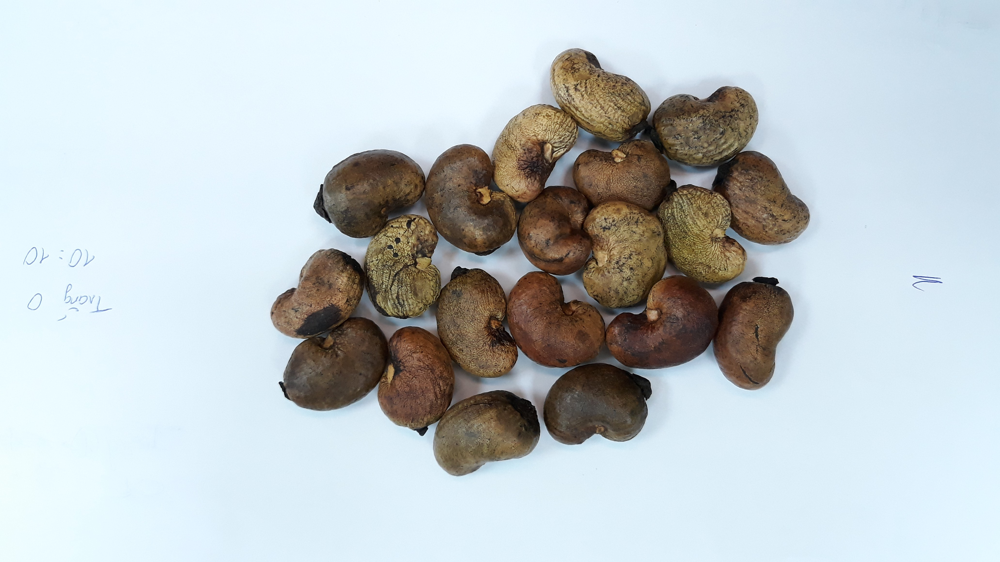

[1569, 1347, 1878, 1790]


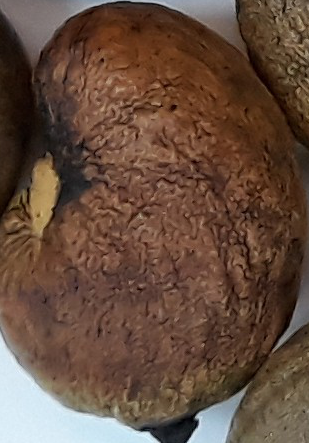

[2405, 823, 2750, 1271]


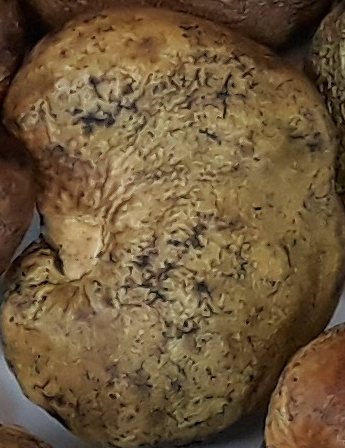

[1127, 1030, 1511, 1389]


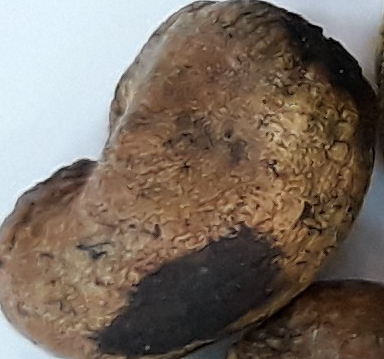

[1485, 884, 1830, 1316]


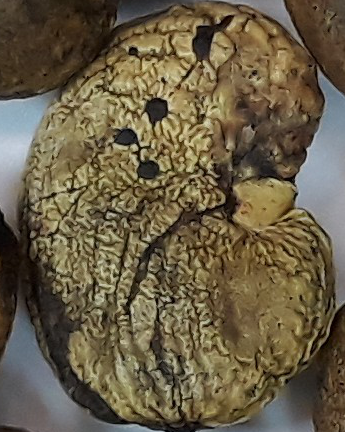

[2937, 1146, 3277, 1607]


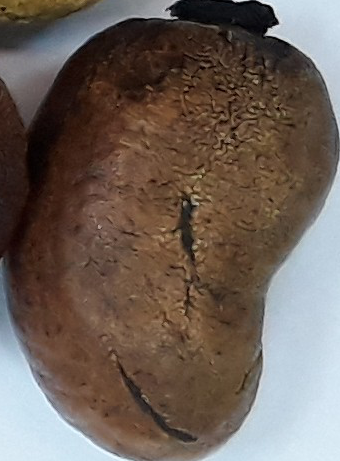

[2131, 759, 2457, 1138]


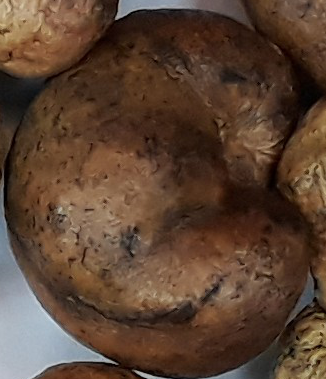

[2941, 635, 3332, 1008]


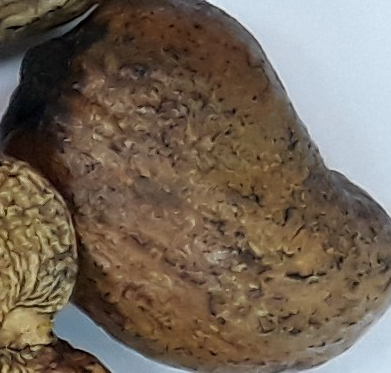

[2723, 746, 3076, 1180]


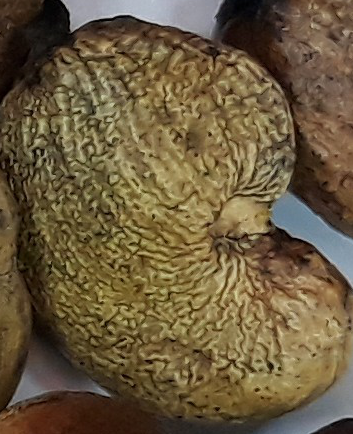

[2259, 200, 2683, 585]


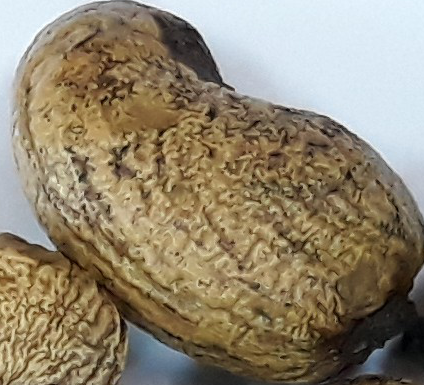

[2013, 425, 2391, 838]


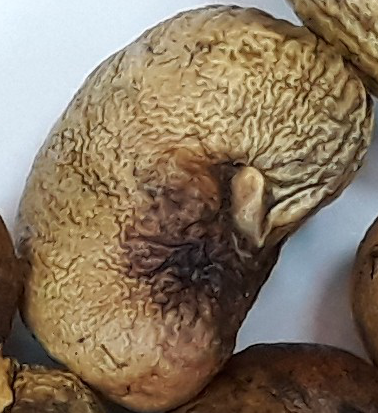

In [ ]:
import pandas as pd
from PIL import Image 
path = "/content/drive/My Drive/kaggle competitive/yolo report/cashew_new/test_new/"
data = pd.read_csv("my_data/private_test.csv")
dem=0
im = Image.open(path+data.loc[0]['filename'])
display(im) 
for id in range(len(data)):
  im = Image.open(path+data.loc[id]['filename'])
  bbox = [int(i) for i in data.loc[id]['bbox'].split(' ')] 
  print(bbox)
  im1 = im.crop(bbox) 
  
  display(im1)
  dem+=1
  if dem==10:
    break